In [6]:
import pandas as pd
from sklearn.manifold import TSNE
data = pd.read_csv("mRna_sorted_out.csv")
cancer_genes = pd.read_csv("cancer_genes.csv", header = None)

In [7]:
#data.head()
patient = data.iloc[0][1:].T
patient = patient.values.reshape(1,-1).T

In [3]:
# Section to extract the cancer gene indices
genes = cancer_genes.iloc[:][0]                 #import gene list 
latent_location = []
for i in genes:
    try:
        location = data.columns.get_loc(i)      #get gene location
        latent_location.append(location)
    except:
        print(i, "Not Located")                 #if gene not present in data
        latent_location.append("Not Located")
        continue

gene_location = pd.DataFrame(latent_location)
#print(gene_location)

KAT6A Not Located
KMT2D Not Located


In [4]:
# extract  location and label of cancer gene
a = cancer_genes.iloc[:][2]
a = a.to_numpy()
gene_location[1] = pd.Series(a, index=gene_location.index)

,0,1
0,1715,12
1,3221,12
2,3222,12
3,3223,12
4,3225,12
5,3226,12
6,3436,12
7,3448,12
8,3450,12
9,3457,12


In [5]:

gene_location.drop([gene_location.index[40],gene_location.index[43]], inplace = True)   #gene 40 and 43 are not in our data
gene_location.reset_index(inplace = True)
gene_location = gene_location.drop(columns=['index'])

,0,1
0,1715,12
1,3221,12
2,3222,12
3,3223,12
4,3225,12
5,3226,12
6,3436,12
7,3448,12
8,3450,12
9,3457,12


In [10]:
#UMAP
import umap  
reducer = umap.UMAP()
umap_results = reducer.fit_transform(patient)
umap_results.shape

AttributeError: module 'umap' has no attribute 'UMAP'

In [7]:
#
color_idx = pd.DataFrame(index=range(0, 20172),columns=range(1))

for j in range(0, 82):
    print("step", j, "of 83")
    for i in range(0, 20172):
        if i == gene_location.iloc[j][0]:
            color_idx.iloc[i] = gene_location.iloc[j][1]
            break
        else:
            continue

step 0 of 83
step 1 of 83
step 2 of 83
step 3 of 83
step 4 of 83
step 5 of 83
step 6 of 83
step 7 of 83
step 8 of 83
step 9 of 83
step 10 of 83
step 11 of 83
step 12 of 83
step 13 of 83
step 14 of 83
step 15 of 83
step 16 of 83
step 17 of 83
step 18 of 83
step 19 of 83
step 20 of 83
step 21 of 83
step 22 of 83
step 23 of 83
step 24 of 83
step 25 of 83
step 26 of 83
step 27 of 83
step 28 of 83
step 29 of 83
step 30 of 83
step 31 of 83
step 32 of 83
step 33 of 83
step 34 of 83
step 35 of 83
step 36 of 83
step 37 of 83
step 38 of 83
step 39 of 83
step 40 of 83
step 41 of 83
step 42 of 83
step 43 of 83
step 44 of 83
step 45 of 83
step 46 of 83
step 47 of 83
step 48 of 83
step 49 of 83
step 50 of 83
step 51 of 83
step 52 of 83
step 53 of 83
step 54 of 83
step 55 of 83
step 56 of 83
step 57 of 83
step 58 of 83
step 59 of 83
step 60 of 83
step 61 of 83
step 62 of 83
step 63 of 83
step 64 of 83
step 65 of 83
step 66 of 83
step 67 of 83
step 68 of 83
step 69 of 83
step 70 of 83
step 71 of 83
st

In [8]:
color_idx = color_idx.fillna(1)
color_idx.to_csv("color_idx.csv", index = None)

In [20]:
final_df = pd.DataFrame(tsne_results, index=range(tsne_results.shape[0]), columns=range(tsne_results.shape[1]))
final_df = pd.concat([final_df,color_idx], axis=1)
final_df.columns = ['a', 'b', 'c']

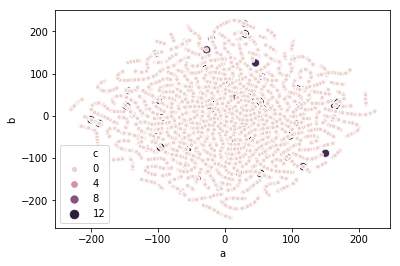

In [21]:
import seaborn as sns
plot = sns.scatterplot('a', 'b', data=final_df, hue = 'c', size = 'c')
plot.figure.savefig("plot.svg", format = 'svg', dpi = 1200)

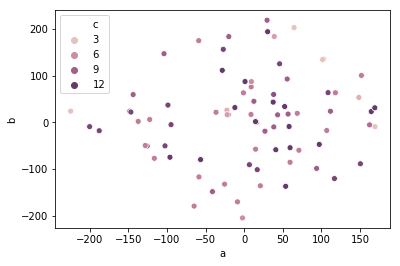

In [38]:
import seaborn as sns
df = final_df.loc[final_df['c']>=2]

cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)
plot = sns.scatterplot('a', 'b', data=df, hue = 'c', palette = cmap)
plot.figure.savefig("plot_only_cancer_genes.svg", format = 'svg', dpi = 1200)